# Queens College Bus Violations Analysis
## Data Preprocessing & Filtering Violations

In [6]:
#install libraries
install.packages(c("tidyverse", "lubridate", "data.table", "leaflet", "nnet", "DT", "ggplot2"))


The downloaded binary packages are in
	/var/folders/r0/14zsy__j0js721wf9chnqr9w0000gn/T//Rtmp9CWFr2/downloaded_packages


In [8]:
#load libraries
library(tidyverse)
library(lubridate)
library(data.table)  # For fast loading if needed
library(leaflet)     # Maps
library(nnet)        # Neural nets
library(DT)          # Interactive tables
library(ggplot2)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.2     ✔ tibble    3.2.1
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘data.table’


The following objects are masked from ‘package:lubridate’:

    hour, isoweek, mday, minute, month, quarter, second, wday, week,
    yday, year


The following objects are masked from ‘package:dplyr’:

    between, first, last


The following object is masked from ‘package:purrr’:

    transpose




In [10]:
#load data
mta_data <- fread("/Users/jhwinniec/Downloads/MTA_Bus_Automated_Camera_Enforcement_Violations__Beginning_October_2019_20250921.csv") 
mta_data <- as_tibble(mta_data)

In [12]:
qc_lat <- 40.736
qc_long <- -73.817
qc_routes <- c("Q44+")

In [14]:
head(mta_data)
summary(mta_data)
dim(mta_data)
names(mta_data)

Violation ID,Vehicle ID,First Occurrence,Last Occurrence,Violation Status,Violation Type,Bus Route ID,Violation Latitude,Violation Longitude,Stop ID,Stop Name,Bus Stop Latitude,Bus Stop Longitude,Violation Georeference,Bus Stop Georeference
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<chr>,<chr>
489749182,c5ae1411153b52556a1e648cc80d718aa519a4bdd189abdbd715dc9058027231,08/20/2025 11:12:08 PM,08/21/2025 12:24:08 AM,TECHNICAL ISSUE/OTHER,MOBILE BUS STOP,BX36,40.84051,-73.88119,102498,EAST TREMONT AV/VYSE AV,40.84108,-73.88248,POINT (-73.881189 40.840509),POINT (-73.882483 40.841076)
489744714,df9044acf85cf55488aea4cd3ce1d0e17ef050551726b632252f1b3dbc871f5e,08/20/2025 11:48:59 PM,08/20/2025 11:54:47 PM,EXEMPT - BUS/PARATRANSIT,MOBILE BUS STOP,BX28,40.87402,-73.89065,100080,PAUL AV/BEDFORD PARK BLVD,40.87463,-73.89154,POINT (-73.890646 40.874017),POINT (-73.891539 40.874629)
489743631,eb5a337966ba65f66ab1db8e169d2446a4fb429b0efc6374052434be832c610d,08/20/2025 10:33:13 PM,08/20/2025 11:56:02 PM,TECHNICAL ISSUE/OTHER,MOBILE DOUBLE PARKED,Q53+,40.72197,-73.86714,550473,WOODHAVEN BLVD/PENELOPE AV,40.72249,-73.86774,POINT (-73.867136 40.721971),POINT (-73.867736 40.722487)
489741945,3f877f70d9b253515a945be807c9c62d5814949f810310f6fe3f8bbe33a39104,08/20/2025 10:50:45 PM,08/20/2025 11:32:43 PM,EXEMPT - OTHER,MOBILE BUS STOP,Q44+,40.76253,-73.83173,501140,UNION ST/35 AV,40.76542,-73.82794,POINT (-73.831728 40.762529),POINT (-73.827944 40.765422)
489741940,7feac037b62d591ffb1214e356157f3dd197fc22fee5bbde47b1b65af6f0d4fd,08/20/2025 10:52:57 AM,08/20/2025 11:16:57 AM,EXEMPT - EMERGENCY VEHICLE,MOBILE BUS STOP,M101,40.81511,-73.95504,401458,AMSTERDAM AV/W 131 ST,40.81601,-73.95442,POINT (-73.95504 40.815113),POINT (-73.954424 40.816009)
489741935,e9122b4e6dac9160ed4fca952a3815fe4c737bfc70cb97e4120a5dbe9a25967f,08/20/2025 11:35:29 PM,08/20/2025 11:39:32 PM,EXEMPT - EMERGENCY VEHICLE,MOBILE BUS STOP,M101,40.79563,-73.94168,402704,3 AV/E 109 ST,40.79377,-73.94300,POINT (-73.941683 40.79563),POINT (-73.943005 40.793765)


  Violation ID        Vehicle ID        First Occurrence   Last Occurrence   
 Min.   :215520220   Length:3778568     Length:3778568     Length:3778568    
 1st Qu.:428897558   Class :character   Class :character   Class :character  
 Median :448461566   Mode  :character   Mode  :character   Mode  :character  
 Mean   :431477090                                                           
 3rd Qu.:465921364                                                           
 Max.   :489749182                                                           
 Violation Status   Violation Type     Bus Route ID       Violation Latitude
 Length:3778568     Length:3778568     Length:3778568     Min.   :40.53     
 Class :character   Class :character   Class :character   1st Qu.:40.70     
 Mode  :character   Mode  :character   Mode  :character   Median :40.78     
                                                          Mean   :40.76     
                                                          3rd Qu.:40.

[1] 3778568      15

[1] "Violation ID"           "Vehicle ID"             "First Occurrence"      
 [4] "Last Occurrence"        "Violation Status"       "Violation Type"        
 [7] "Bus Route ID"           "Violation Latitude"     "Violation Longitude"   
[10] "Stop ID"                "Stop Name"              "Bus Stop Latitude"     
[13] "Bus Stop Longitude"     "Violation Georeference" "Bus Stop Georeference"

In [16]:
# Check column types
str(mta_data[, c("Violation Latitude", "Violation Longitude", "Violation Status")])

# Check status values
unique(mta_data$`Violation Status`)

# Sample lat/long values
head(mta_data$`Violation Latitude`, 10)
head(mta_data$`Violation Longitude`, 10)

tibble [3,778,568 × 3] (S3: tbl_df/tbl/data.frame)
 $ Violation Latitude : num [1:3778568] 40.8 40.9 40.7 40.8 40.8 ...
 $ Violation Longitude: num [1:3778568] -73.9 -73.9 -73.9 -73.8 -74 ...
 $ Violation Status   : chr [1:3778568] "TECHNICAL ISSUE/OTHER" "EXEMPT - BUS/PARATRANSIT" "TECHNICAL ISSUE/OTHER" "EXEMPT - OTHER" ...
 - attr(*, ".internal.selfref")=<externalptr> 


[1] "TECHNICAL ISSUE/OTHER"        "EXEMPT - BUS/PARATRANSIT"    
[3] "EXEMPT - OTHER"               "EXEMPT - EMERGENCY VEHICLE"  
[5] "DRIVER/VEHICLE INFO MISSING"  "EXEMPT - COMMERCIAL UNDER 20"
[7] "VIOLATION ISSUED"

[1] 40.84051 40.87402 40.72197 40.76253 40.81511 40.79563 40.84048 40.66848
 [9] 40.76147 40.70529

[1] -73.88119 -73.89065 -73.86714 -73.83173 -73.95504 -73.94168 -73.88115
 [8] -73.93115 -73.93526 -73.80949

In [18]:
# Check Bus Route ID values
unique(mta_data$`Bus Route ID`)

# Check exempt status counts
table(mta_data$`Violation Status`)

# Check timestamp parsing
sum(is.na(mdy_hms(mta_data$`First Occurrence`)))
sum(is.na(mdy_hms(mta_data$`Last Occurrence`)))

# Check distance range
summary(sqrt((mta_data$`Violation Latitude` - 40.736)^2 + (mta_data$`Violation Longitude` - (-73.817))^2) * 111)

[1] "BX36"      "BX28"      "Q53+"      "Q44+"      "M101"      "B46+"     
 [7] "Q69"       "BX38"      "M42"       "M60+"      "M2"        "BX6+"     
[13] "B35"       "BX35"      "M4"        "B82+"      "M34+"      "M15+"     
[19] "BX19"      "BX41+"     "M23+"      "M100"      "BX12+"     "Q43"      
[25] "Q54"       "B41"       "B44+"      "M79+"      "Q58"       "M14+"     
[31] "B25"       "B62"       "M86+"      "B26"       "Q5"        "B42"      
[37] "S79+"      "BX5"       "BX28-BX38" "S46"       ""


 DRIVER/VEHICLE INFO MISSING     EXEMPT - BUS/PARATRANSIT 
                      273968                       190192 
EXEMPT - COMMERCIAL UNDER 20   EXEMPT - EMERGENCY VEHICLE 
                      257374                       286253 
              EXEMPT - OTHER        TECHNICAL ISSUE/OTHER 
                      136991                       320912 
            VIOLATION ISSUED 
                     2312878 

[1] 0

[1] 0

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.8903 14.0271 16.0810 15.2345 17.8585 44.1360 

In [20]:
violations_qc <- mta_data %>%
  mutate(
    first_occurrence = mdy_hms(`First Occurrence`, truncated = 3), #time
    is_exempt = str_detect(`Violation Status`, "(?i)EXEMPT"), #finding to see if it is exempt
    dist_to_campus_km = sqrt((`Violation Latitude` - qc_lat)^2 + (`Violation Longitude` - qc_long)^2) * 111
  ) %>% #finding the distance away from campus
  filter(
    `Bus Route ID` %in% qc_routes,  # Q44+ only
    is_exempt,                      # Exempt vehicles
    dist_to_campus_km <= 5          # Within 5 km
  )

In [22]:
dim(violations_qc)
head(violations_qc)

[1] 34305    18

Violation ID,Vehicle ID,First Occurrence,Last Occurrence,Violation Status,Violation Type,Bus Route ID,Violation Latitude,Violation Longitude,Stop ID,Stop Name,Bus Stop Latitude,Bus Stop Longitude,Violation Georeference,Bus Stop Georeference,first_occurrence,is_exempt,dist_to_campus_km
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<dttm>,<lgl>,<dbl>
489741945,3f877f70d9b253515a945be807c9c62d5814949f810310f6fe3f8bbe33a39104,08/20/2025 10:50:45 PM,08/20/2025 11:32:43 PM,EXEMPT - OTHER,MOBILE BUS STOP,Q44+,40.76253,-73.83173,501140,UNION ST/35 AV,40.76542,-73.82794,POINT (-73.831728 40.762529),POINT (-73.827944 40.765422),2025-08-20 22:50:45,TRUE,3.368081
489741818,9efab913d2329aae1a294cc0316679b86dcdccc7e7294f3ec6b96d79db49850f,08/20/2025 11:15:31 PM,08/20/2025 11:19:56 PM,EXEMPT - BUS/PARATRANSIT,MOBILE BUS STOP,Q44+,40.70529,-73.80949,502137,SUTPHIN BLVD/HILLSIDE AV,40.70538,-73.80959,POINT (-73.809492 40.705292),POINT (-73.809594 40.705382),2025-08-20 23:15:31,TRUE,3.508990
489740582,e9f61fd7d4d8df0a7d76bf2ac1b8c8b0d808cc51376310d77627c6f28f474911,08/20/2025 10:12:48 PM,08/20/2025 10:19:47 PM,EXEMPT - BUS/PARATRANSIT,MOBILE BUS STOP,Q44+,40.70259,-73.79940,503964,MERRICK BLVD/ARCHER AV,40.70491,-73.79331,POINT (-73.799399 40.702592),POINT (-73.793306 40.704907),2025-08-20 22:12:48,TRUE,4.191466
489740523,b6e7951e7990abd20c90f8de0b99d0f402d064c8880ad45ea48ef3a56f683669,08/20/2025 10:00:53 PM,08/20/2025 10:06:10 PM,EXEMPT - BUS/PARATRANSIT,MOBILE BUS STOP,Q44+,40.70527,-73.80951,502137,SUTPHIN BLVD/HILLSIDE AV,40.70538,-73.80959,POINT (-73.80951 40.705266),POINT (-73.809594 40.705382),2025-08-20 22:00:53,TRUE,3.511319
489739375,3f877f70d9b253515a945be807c9c62d5814949f810310f6fe3f8bbe33a39104,08/20/2025 08:04:45 PM,08/20/2025 08:22:51 PM,EXEMPT - OTHER,MOBILE BUS STOP,Q44+,40.76253,-73.83172,501140,UNION ST/35 AV,40.76542,-73.82794,POINT (-73.831717 40.762534),POINT (-73.827944 40.765422),2025-08-20 20:04:45,TRUE,3.367973
489738933,e9f61fd7d4d8df0a7d76bf2ac1b8c8b0d808cc51376310d77627c6f28f474911,08/20/2025 07:48:43 PM,08/20/2025 08:32:30 PM,EXEMPT - BUS/PARATRANSIT,MOBILE BUS STOP,Q44+,40.70270,-73.79886,500552,MERRICK BLVD/218 ST,40.67950,-73.75116,POINT (-73.798864 40.7027),POINT (-73.751159 40.679505),2025-08-20 19:48:43,TRUE,4.208942


## Identifying top 250 repeat offenders

In [24]:
repeats_qc <- violations_qc %>%
  group_by(`Vehicle ID`) %>% #group by vehicle ID
  summarise(
    violation_count = n(), # compute the number of violations n() for each vehicle
    .groups = "drop" # removes all groups so the repeats_qc is a regular data frame
  ) %>%
  filter(violation_count > 1) %>%
  arrange(desc(violation_count)) %>%
  slice_head(n = 250)

In [26]:
dim(repeats_qc)
head(repeats_qc, 50)

[1] 250   2

Vehicle ID,violation_count
<chr>,<int>
729afe2bc01420ab8c66a36692cfc829ea5a0f829b17c705e85beb53caf45423,552
d3394e8be16cf7189dccc9b3621153fcffb272574bc3079a8a3aa63839f249e0,499
80228a16bca871e024130c63ddf5552024720ac5f9b583df1c7b35bfdb52d630,444
1ff22289fd4c31a9404d9470c08cddf9bec229181bf1054605ed0afafaaa7605,247
b274337d1e7fcd20a3dd7a23f4c43553b2234a9c4935028d947e368e8156a83d,232
58428b9d48d2ac0c9c2213135b018758add2fbc612d48c082dff2624cddbfd16,196
a0d302f41d928ef753f174c829474b0a90c3ae6d76ceb2bbce002370b7f7b264,167
c61d7f2b095752319ea064c9fdaa4013066a46cc6ad274376d01d100ba65dfd0,138
1ef67d49a3ae37531196dd43a654bd3ccbc14ba05c9847ada319c21d8b0078ef,130


## Calculate delays and student impact

In [28]:
#Estimate delays (1.5 min/violation) and student impact (45 students/bus) for the top 250 repeat offenders.

# Calculate delays
repeats_with_delay <- repeats_qc %>%
  mutate(
    total_delay_min = violation_count * 1.5,  # 1.5 min per violation
    students_affected = total_delay_min * 45   # 45 students per bus
  )

# Summarize
total_delay_hours <- sum(repeats_with_delay$total_delay_min) / 60
total_student_hours <- sum(repeats_with_delay$students_affected) / 60
cat("Total delay from top 250 repeats:", round(total_delay_hours, 1), "hours\n")
cat("Total student-hours lost:", round(total_student_hours, 1), "\n")

# Display table
DT::datatable(repeats_with_delay, options = list(pageLength = 10))

Total delay from top 250 repeats: 279 hours
Total student-hours lost: 12552.8 


HTML widgets cannot be represented in plain text (need html)

## Heatmap for violation hotspots

In [30]:
install.packages(c("leaflet.extras", "geosphere"))
library(leaflet.extras)
library(geosphere)


The downloaded binary packages are in
	/var/folders/r0/14zsy__j0js721wf9chnqr9w0000gn/T//Rtmp9CWFr2/downloaded_packages


In [32]:
mock_ai_lat <- 40.737  # Mock AI camera location (slightly offset from QC) hypothetical placement of AI-powered camera to detect bus lane violations
mock_ai_long <- -73.818

leaflet(data = violations_qc) %>%
  addTiles() %>%  # Add base map tiles
  addHeatmap(
    lng = ~`Violation Longitude`, 
    lat = ~`Violation Latitude`, 
    blur = 20,  # Soften the edges
    max = 0.05,  # Intensity scaling
    radius = 15  # Point radius for density
  ) %>%
  addMarkers(
    lng = qc_long, 
    lat = qc_lat, 
    popup = "Queens College",
    label = "Queens College"
  ) %>%
  addMarkers(
    lng = mock_ai_long, 
    lat = mock_ai_lat, 
    popup = "Mock AI Camera Location",
    label = "Mock AI Camera"
  ) %>%
  setView(lng = qc_long, lat = qc_lat, zoom = 14)  # Center on Queens College

HTML widgets cannot be represented in plain text (need html)

## Graphs/plots for data visualizations


Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout




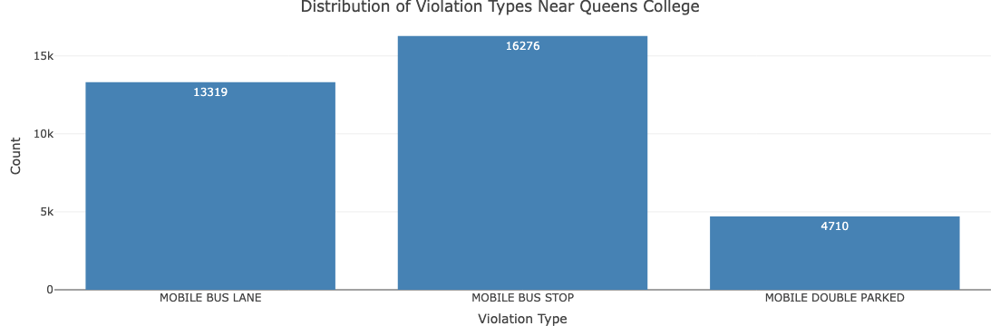

Warning message:
“'plotly::export' is deprecated.
Use 'orca' instead.
See help("Deprecated")”


ERROR: Error: Package `webshot` required for `export`.
Please install and try again.


In [48]:
library(plotly)

# Calculate violation type counts
violation_counts <- violations_qc %>%
  count(`Violation Type`) %>%
  mutate(label = paste(`Violation Type`, ": ", n))

# Bar chart with counts
plot_ly(data = violation_counts, x = ~`Violation Type`, y = ~n, type = "bar", 
        marker = list(color = "steelblue"),
        text = ~n, textposition = "auto") %>%
  layout(title = "Distribution of Violation Types Near Queens College",
         xaxis = list(title = "Violation Type"), yaxis = list(title = "Count"))
plotly::export(p = last_plot(), file = "violation_types_bar.png")


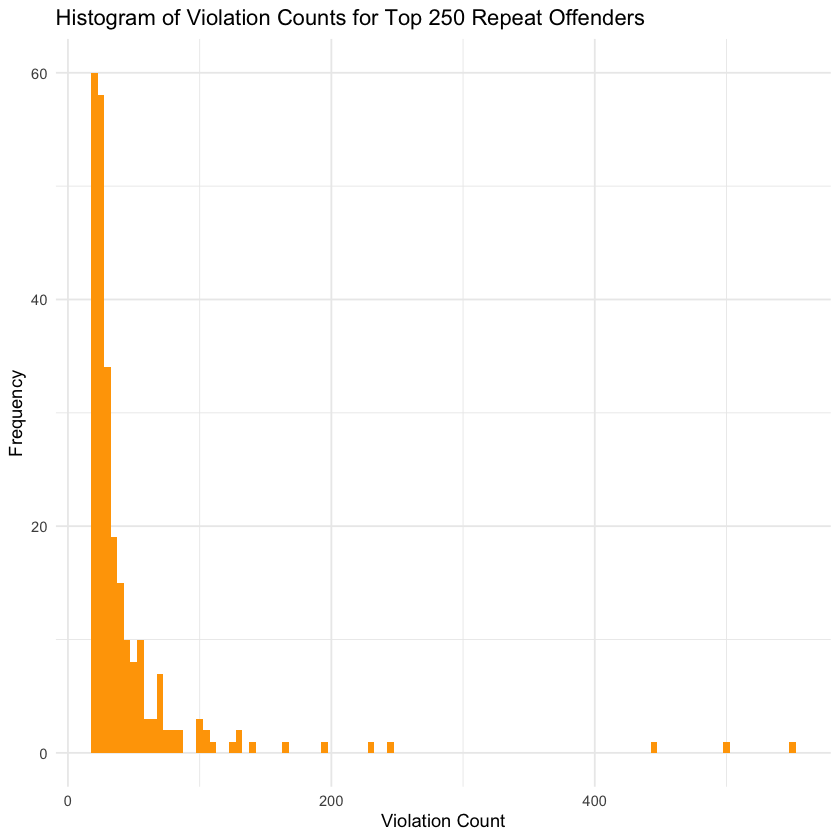

In [52]:
# 2. Histogram: Violation Counts for Repeat Offenders
ggplot(repeats_qc, aes(x = violation_count)) +
  geom_histogram(binwidth = 5, fill = "orange") +
  labs(title = "Histogram of Violation Counts for Top 250 Repeat Offenders", x = "Violation Count", y = "Frequency") +
  theme_minimal()


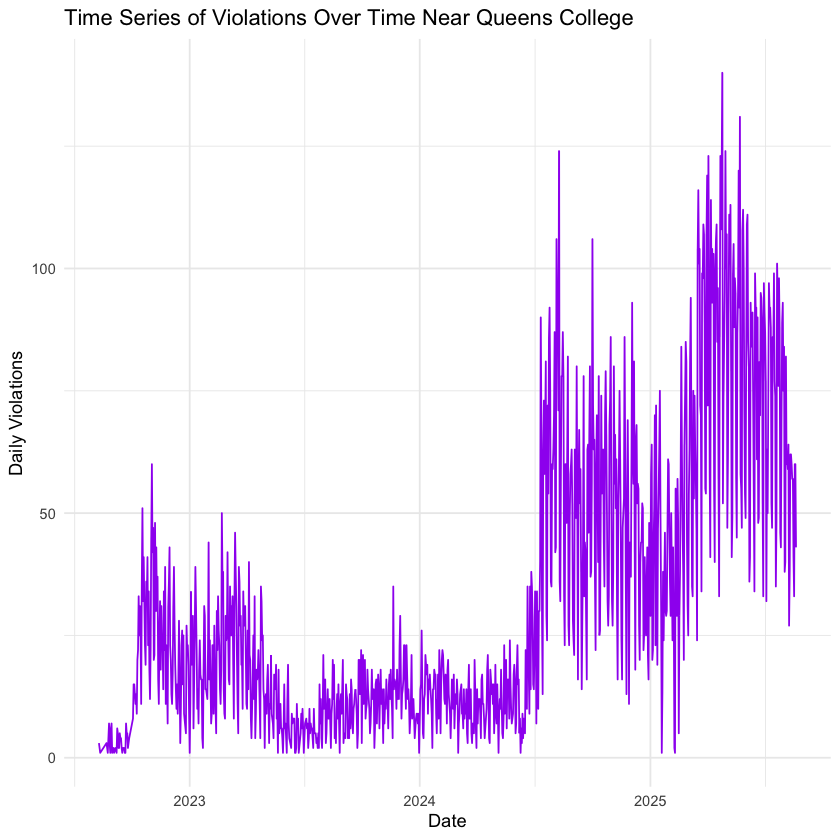

In [44]:
# 3. Time Series: Violations Over Time (per day)
violations_qc %>%
  mutate(date = date(first_occurrence)) %>%
  group_by(date) %>%
  summarise(daily_violations = n(), .groups = "drop") %>%
  ggplot(aes(x = date, y = daily_violations)) +
  geom_line(color = "purple") +
  labs(title = "Time Series of Violations Over Time Near Queens College", x = "Date", y = "Daily Violations") +
  theme_minimal()

Warning message in RColorBrewer::brewer.pal(N, "Set2"):
“minimal value for n is 3, returning requested palette with 3 different levels
”
Warning message in RColorBrewer::brewer.pal(N, "Set2"):
“minimal value for n is 3, returning requested palette with 3 different levels
”
Warning message in RColorBrewer::brewer.pal(N, "Set2"):
“minimal value for n is 3, returning requested palette with 3 different levels
”
Warning message in RColorBrewer::brewer.pal(N, "Set2"):
“minimal value for n is 3, returning requested palette with 3 different levels
”


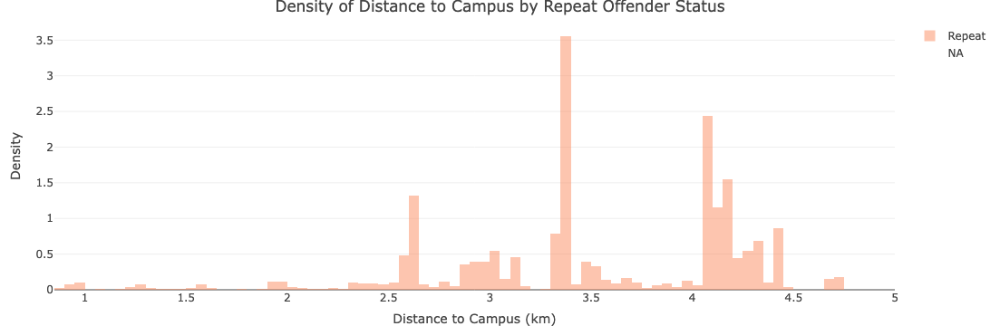

Warning message:
“'plotly::export' is deprecated.
Use 'orca' instead.
See help("Deprecated")”
Warning message in RColorBrewer::brewer.pal(N, "Set2"):
“minimal value for n is 3, returning requested palette with 3 different levels
”
Warning message in RColorBrewer::brewer.pal(N, "Set2"):
“minimal value for n is 3, returning requested palette with 3 different levels
”
Warning message in RColorBrewer::brewer.pal(N, "Set2"):
“minimal value for n is 3, returning requested palette with 3 different levels
”
Warning message in RColorBrewer::brewer.pal(N, "Set2"):
“minimal value for n is 3, returning requested palette with 3 different levels
”
Warning message in RColorBrewer::brewer.pal(N, "Set2"):
“minimal value for n is 3, returning requested palette with 3 different levels
”
Warning message in RColorBrewer::brewer.pal(N, "Set2"):
“minimal value for n is 3, returning requested palette with 3 different levels
”


ERROR: Error: Package `webshot` required for `export`.
Please install and try again.


In [54]:
library(plotly)

# Density data
density_data <- violations_qc %>%
  left_join(repeats_qc %>% select(`Vehicle ID`, violation_count), by = "Vehicle ID") %>%
  mutate(is_repeat = ifelse(violation_count > 1, "Repeat", "Single"))

plot_ly(data = density_data, x = ~dist_to_campus_km, type = "histogram", histnorm = "probability density", 
        color = ~is_repeat, opacity = 0.5, bingroup = 1) %>%
  layout(title = "Density of Distance to Campus by Repeat Offender Status",
         xaxis = list(title = "Distance to Campus (km)"), yaxis = list(title = "Density"),
         barmode = "overlay")
plotly::export(p = last_plot(), file = "distance_density.png")

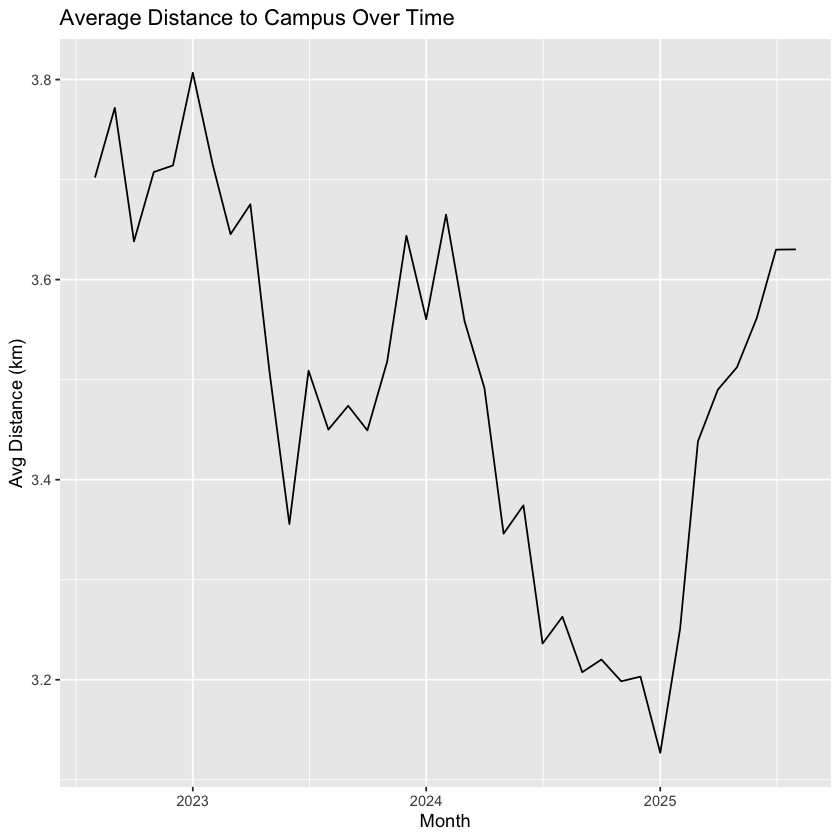

In [74]:
violations_qc %>%
  mutate(month = floor_date(as.Date(`First Occurrence`, format = "%m/%d/%Y"), "month")) %>%
  group_by(month) %>%
  summarise(avg_dist_km = mean(dist_to_campus_km, na.rm = TRUE)) %>%
  ggplot(aes(x = month, y = avg_dist_km)) +
  geom_line() +
  labs(title = "Average Distance to Campus Over Time", x = "Month", y = "Avg Distance (km)")

## Advanced Models - Regression to find to see which factors appear to be most important for predicting repeat offender likelihood

In [81]:
# Create a dataset with vehicle violation counts and other features
regression_data <- violations_qc %>%
  group_by(`Vehicle ID`) %>%
  summarise(
    violation_count = n(),
    avg_distance = mean(dist_to_campus_km),
    first_violation = min(first_occurrence),
    last_violation = max(first_occurrence),
    violation_types = n_distinct(`Violation Type`),
    stop_count = n_distinct(`Stop ID`),
    .groups = "drop"
  ) %>%
  # Add time-based features
  mutate(
    activity_duration = as.numeric(difftime(last_violation, first_violation, units = "days")),
    is_repeat_offender = violation_count > 1
  ) %>%
  # Join with original data to get additional features
  left_join(
    violations_qc %>% 
      select(`Vehicle ID`, `Violation Status`, `Violation Type`, dist_to_campus_km) %>%
      distinct(`Vehicle ID`, .keep_all = TRUE),
    by = "Vehicle ID"
  )

In [83]:
# Split data into training and testing sets
set.seed(123) # For reproducibility
train_indices <- sample(1:nrow(regression_data), size = 0.7 * nrow(regression_data))
train <- regression_data[train_indices, ]
test <- regression_data[-train_indices, ]

In [85]:
# Model 1: Basic model with distance and violation type
repeat_model1 <- lm(violation_count ~ avg_distance + violation_types, data = train)
summary(repeat_model1)


Call:
lm(formula = violation_count ~ avg_distance + violation_types, 
    data = train)

Residuals:
   Min     1Q Median     3Q    Max 
-14.59  -1.50  -0.96   0.00 542.33 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)      -7.0642     0.6430 -10.986  < 2e-16 ***
avg_distance      0.5022     0.1588   3.162  0.00157 ** 
violation_types   7.5195     0.3214  23.399  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 12.15 on 6567 degrees of freedom
Multiple R-squared:  0.07997,	Adjusted R-squared:  0.07968 
F-statistic: 285.4 on 2 and 6567 DF,  p-value: < 2.2e-16


In [87]:
# Model 2: Add activity duration
repeat_model2 <- lm(violation_count ~ avg_distance + violation_types + activity_duration, data = train)
summary(repeat_model2)



Call:
lm(formula = violation_count ~ avg_distance + violation_types + 
    activity_duration, data = train)

Residuals:
   Min     1Q Median     3Q    Max 
-16.39  -0.82  -0.60  -0.07 541.92 

Coefficients:
                    Estimate Std. Error t value Pr(>|t|)    
(Intercept)       -2.6590498  0.7068447  -3.762  0.00017 ***
avg_distance       0.2715476  0.1573451   1.726  0.08443 .  
violation_types    3.3358454  0.4345641   7.676 1.88e-14 ***
activity_duration  0.0128234  0.0009122  14.057  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 11.98 on 6566 degrees of freedom
Multiple R-squared:  0.1068,	Adjusted R-squared:  0.1064 
F-statistic: 261.8 on 3 and 6566 DF,  p-value: < 2.2e-16


In [89]:
# Model 3: Add stop count
repeat_model3 <- lm(violation_count ~ avg_distance + violation_types + activity_duration + stop_count, data = train)
summary(repeat_model3)



Call:
lm(formula = violation_count ~ avg_distance + violation_types + 
    activity_duration + stop_count, data = train)

Residuals:
   Min     1Q Median     3Q    Max 
-33.07  -0.38  -0.18  -0.11 520.64 

Coefficients:
                    Estimate Std. Error t value Pr(>|t|)    
(Intercept)        0.8604348  0.6679098   1.288    0.198    
avg_distance      -0.0846454  0.1470299  -0.576    0.565    
violation_types   -2.5012190  0.4450080  -5.621 1.98e-08 ***
activity_duration  0.0040909  0.0008937   4.578 4.79e-06 ***
stop_count         3.1039736  0.0982029  31.608  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 11.16 on 6565 degrees of freedom
Multiple R-squared:  0.2248,	Adjusted R-squared:  0.2243 
F-statistic:   476 on 4 and 6565 DF,  p-value: < 2.2e-16


In [111]:
# Make predictions on test set
repeat_model1_prediction <- predict(repeat_model1, newdata = test)
repeat_model2_prediction <- predict(repeat_model2, newdata = test)
repeat_model3_prediction <- predict(repeat_model3, newdata = test)


In [113]:
# Calculate RMSE for each model
repeat_model1_error <- test$violation_count - repeat_model1_prediction
repeat_model2_error <- test$violation_count - repeat_model2_prediction
repeat_model3_error <- test$violation_count - repeat_model3_prediction

cat("Model 1 RMSE:", sqrt(mean(repeat_model1_error^2)), "\n")
cat("Model 2 RMSE:", sqrt(mean(repeat_model2_error^2)), "\n")
cat("Model 3 RMSE:", sqrt(mean(repeat_model3_error^2)), "\n")


Model 1 RMSE: 10.54162 
Model 2 RMSE: 10.22466 
Model 3 RMSE: 9.500314 


In [115]:
# Interpret the best model
cat("\n=== Most Important Factors for Repeat Offenders ===\n")
best_model <- repeat_model3  # Assuming model 4 is best based on RMSE
summary(best_model)


=== Most Important Factors for Repeat Offenders ===



Call:
lm(formula = violation_count ~ avg_distance + violation_types + 
    activity_duration + stop_count, data = train)

Residuals:
   Min     1Q Median     3Q    Max 
-33.07  -0.38  -0.18  -0.11 520.64 

Coefficients:
                    Estimate Std. Error t value Pr(>|t|)    
(Intercept)        0.8604348  0.6679098   1.288    0.198    
avg_distance      -0.0846454  0.1470299  -0.576    0.565    
violation_types   -2.5012190  0.4450080  -5.621 1.98e-08 ***
activity_duration  0.0040909  0.0008937   4.578 4.79e-06 ***
stop_count         3.1039736  0.0982029  31.608  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 11.16 on 6565 degrees of freedom
Multiple R-squared:  0.2248,	Adjusted R-squared:  0.2243 
F-statistic:   476 on 4 and 6565 DF,  p-value: < 2.2e-16


In [117]:
# Extract and interpret coefficients
coefficients_df <- as.data.frame(summary(best_model)$coefficients)
coefficients_df$Variable <- rownames(coefficients_df)
coefficients_df <- coefficients_df %>%
  arrange(desc(abs(Estimate))) %>%
  select(Variable, Estimate, `Std. Error`, `t value`, `Pr(>|t|)`)

print(coefficients_df)

                           Variable    Estimate   Std. Error    t value
stop_count               stop_count  3.10397365 0.0982028933 31.6077617
violation_types     violation_types -2.50121902 0.4450079735 -5.6206162
(Intercept)             (Intercept)  0.86043484 0.6679098395  1.2882500
avg_distance           avg_distance -0.08464537 0.1470299177 -0.5757016
activity_duration activity_duration  0.00409090 0.0008936921  4.5775270
                       Pr(>|t|)
stop_count        3.119302e-204
violation_types    1.980931e-08
(Intercept)        1.977044e-01
avg_distance       5.648366e-01
activity_duration  4.791708e-06


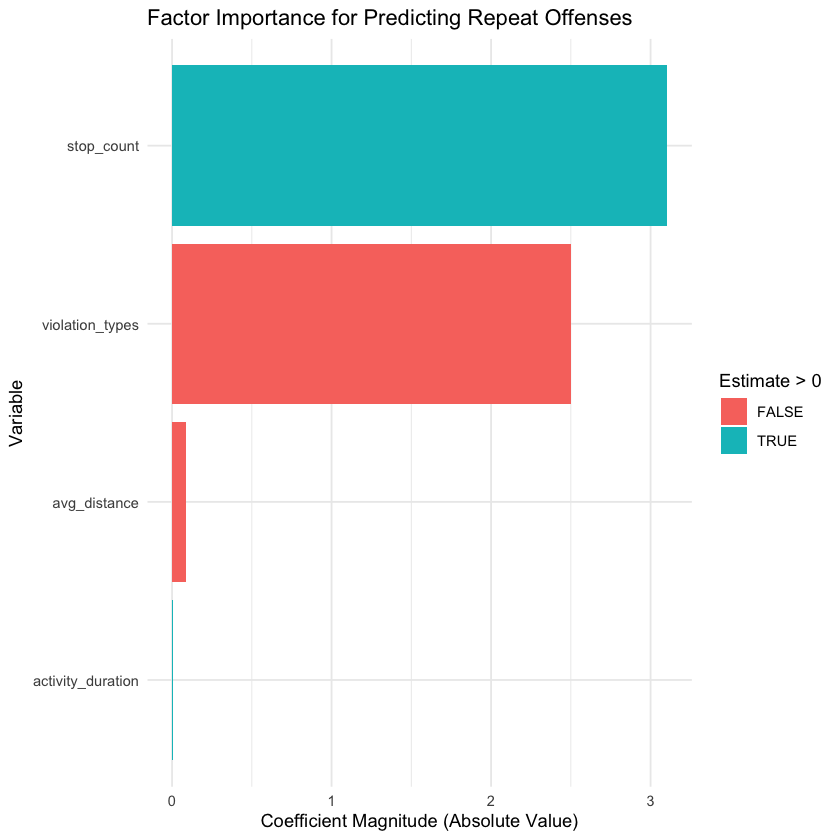

In [119]:
# Create a visualization of important factors
library(ggplot2)

# Plot coefficient magnitudes
ggplot(coefficients_df %>% filter(Variable != "(Intercept)"), 
       aes(x = reorder(Variable, abs(Estimate)), y = abs(Estimate), fill = Estimate > 0)) +
  geom_bar(stat = "identity") +
  coord_flip() +
  labs(title = "Factor Importance for Predicting Repeat Offenses",
       x = "Variable",
       y = "Coefficient Magnitude (Absolute Value)") +
  theme_minimal()